In [ ]:
import sys
import os
import glob
import random
import time

import numpy as np
import pandas as pd

import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid import ImageGrid
import tensorflow as tf

plt.style.use("dark_background")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.
  if sys.path[0] == '':


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
DataPath='/content/drive/MyDrive/lgg-mri-segmentation/kaggle_3m/'

In [ ]:
# DataPath = '/Users/Marzieh/Desktop/brain/lgg-mri-segmentation/kaggle_3m/'


In [ ]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
dirs = []
images = []
masks = []
for dirname, _, filenames in os.walk(DataPath):
    for filename in filenames:
        if 'mask'in filename:
            dirs.append(dirname.replace(DataPath, ''))
            masks.append(filename)
            images.append(filename.replace('_mask', ''))

In [ ]:
len(dirs), len(images), len(masks)

(3929, 3929, 3929)

In [ ]:
imagePath_df = pd.DataFrame({'directory':dirs, 'images': images, 'masks': masks})

In [ ]:
imagePath_df.head()

,directory,images,masks
0,TCGA_DU_6407_19860514,TCGA_DU_6407_19860514_23.tif,TCGA_DU_6407_19860514_23_mask.tif
1,TCGA_DU_6407_19860514,TCGA_DU_6407_19860514_30.tif,TCGA_DU_6407_19860514_30_mask.tif
2,TCGA_DU_6407_19860514,TCGA_DU_6407_19860514_14.tif,TCGA_DU_6407_19860514_14_mask.tif
3,TCGA_DU_6407_19860514,TCGA_DU_6407_19860514_33.tif,TCGA_DU_6407_19860514_33_mask.tif
4,TCGA_DU_6407_19860514,TCGA_DU_6407_19860514_45.tif,TCGA_DU_6407_19860514_45_mask.tif


In [ ]:
def print_imShape():
    idx = np.random.randint(0, len(imagePath_df))
    
    imagePath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['images'].iloc[idx])
    maskPath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['masks'].iloc[idx])
    
    image = cv2.imread(imagePath)
    mask = cv2.imread(maskPath)
    
    print(image.shape, mask.shape)

In [ ]:
for i in range(5):
    print_imShape()

(256, 256, 3) (256, 256, 3)
(256, 256, 3) (256, 256, 3)
(256, 256, 3) (256, 256, 3)
(256, 256, 3) (256, 256, 3)
(256, 256, 3) (256, 256, 3)


In [ ]:
def plot_images():
    idx = np.random.randint(0, len(imagePath_df))
    
    imagePath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['images'].iloc[idx])
    maskPath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['masks'].iloc[idx])
    
    image = cv2.imread(imagePath)
    mask = cv2.imread(maskPath)
    
    fig, axs = plt.subplots(1,3, figsize=[13,15])
    
    axs[0].imshow(image)
    axs[0].set_title('Brain MRI')
    
    axs[1].imshow(mask)
    axs[1].set_title('Mask')
    
    axs[2].imshow(image)
    axs[2].imshow(mask, alpha=0.3)
    axs[2].set_title('MRI with mask')
    
    plt.grid(False)
    plt.show()

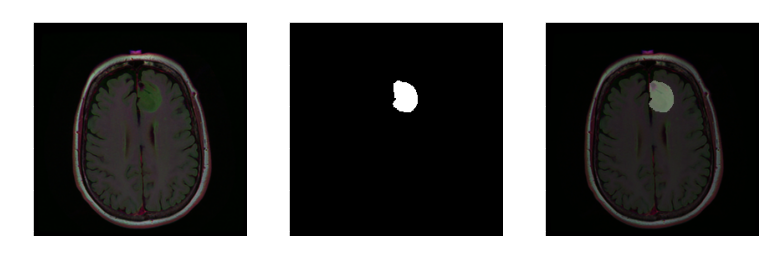

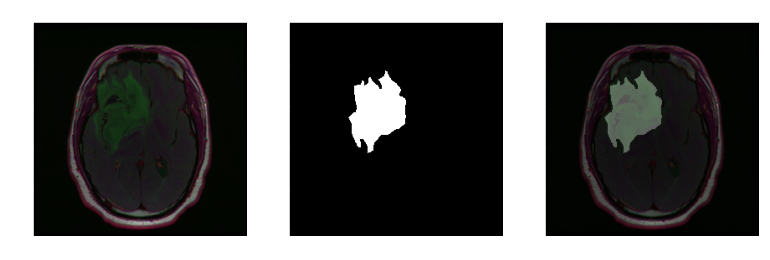

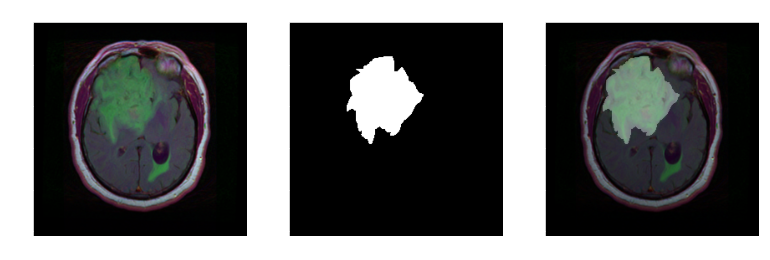

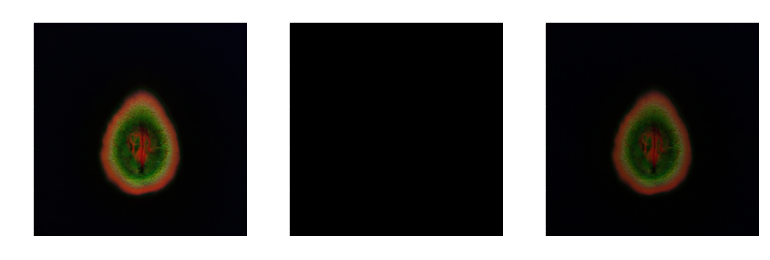

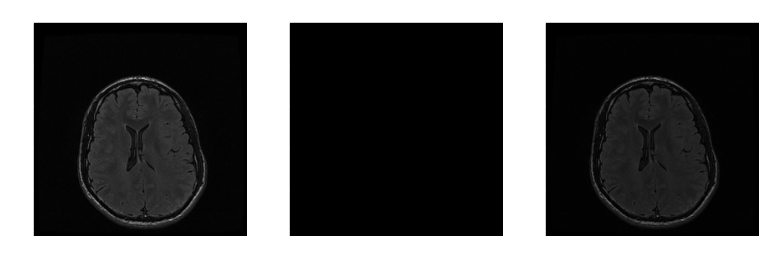

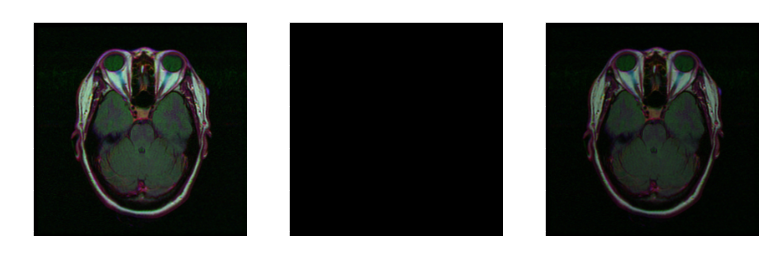

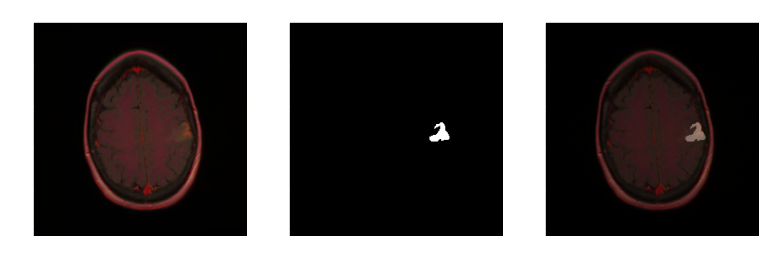

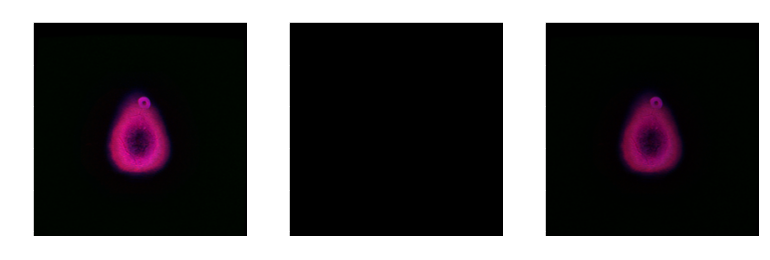

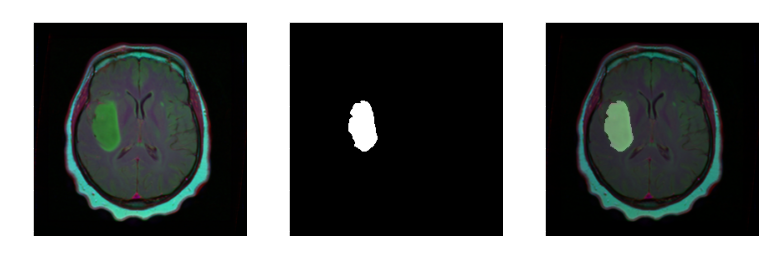

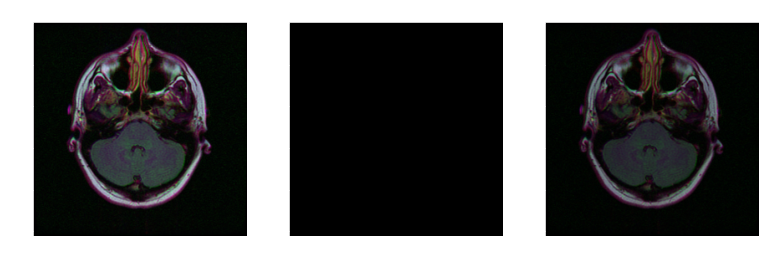

In [ ]:
for i in range(10):
    plot_images()

In [ ]:
def plot_images(idx):
    imagePath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['images'].iloc[idx])
    maskPath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['masks'].iloc[idx])

    figure,axis = plt.subplots(1,2,figsize=(10,10))

    Example_Reading_Image = cv2.cvtColor(cv2.imread(imagePath),cv2.COLOR_BGR2RGB)
    Example_Reading_Mask = cv2.cvtColor(cv2.imread(maskPath),cv2.COLOR_BGR2RGB)

    axis[0].set_xlabel(Example_Reading_Image.shape)
    axis[0].set_ylabel(Example_Reading_Image.size)
    axis[0].set_title("TUMOR")
    Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image)

    axis[1].set_xlabel(Example_Reading_Mask.shape)
    axis[1].set_ylabel(Example_Reading_Mask.size)
    axis[1].set_title("MASK")
    axis[1].imshow(Example_Reading_Mask)

    figure.colorbar(Example_Colorbar_Plt,
                    ax=axis.ravel().tolist(),
                    shrink=0.5,
                    ticks=range(6),
                    label='DENSITY')

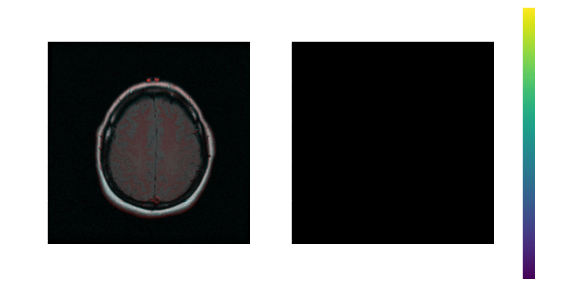

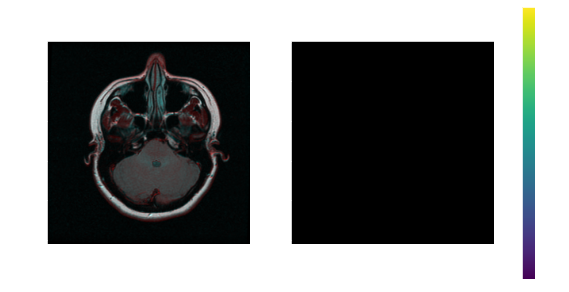

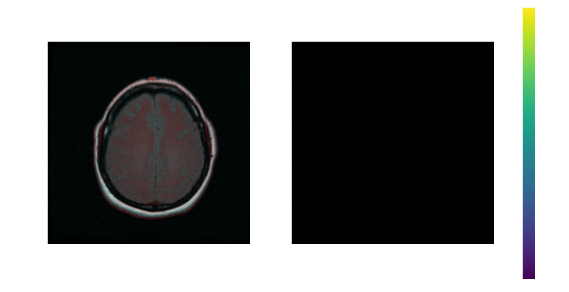

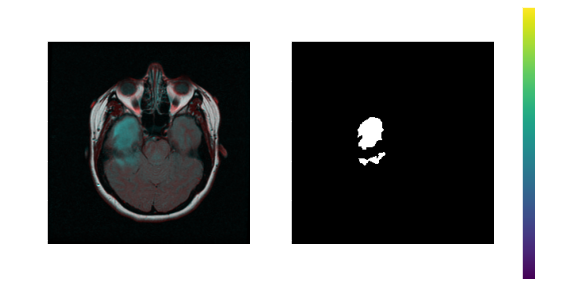

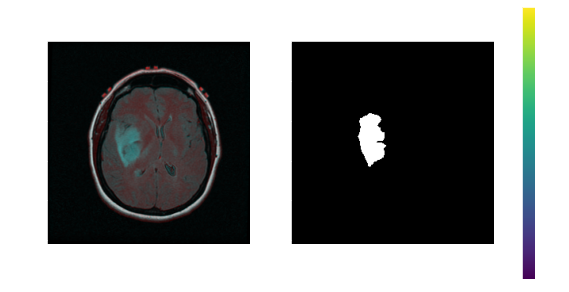

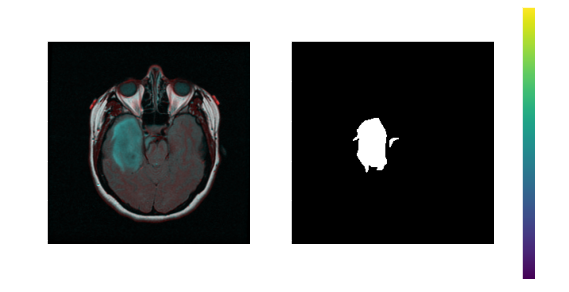

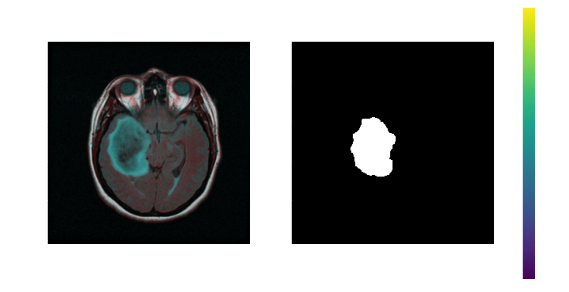

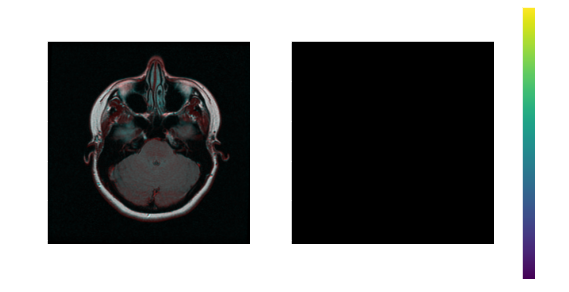

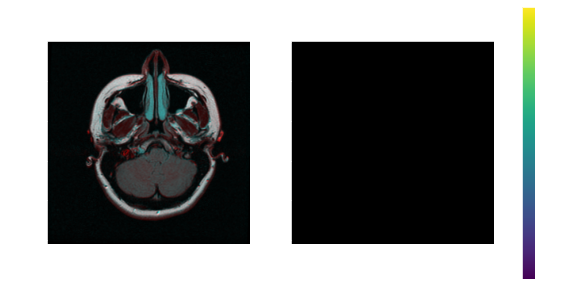

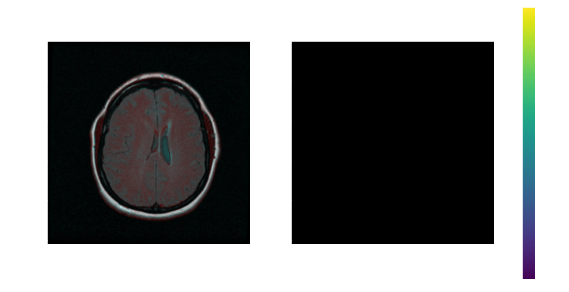

In [ ]:
for i in range(20,30):
    plot_images(i)

SPECTRUM TESTING

In [ ]:
def plot_images(idx,cmap):
    imagePath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['images'].iloc[idx])
    maskPath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['masks'].iloc[idx])
    figure,axis = plt.subplots(1,2,figsize=(10,10))

    Example_Reading_Image = cv2.cvtColor(cv2.imread(imagePath),cv2.COLOR_BGR2RGB)
    Example_Reading_Mask = cv2.cvtColor(cv2.imread(maskPath),cv2.COLOR_BGR2RGB)

    axis[0].set_xlabel(Example_Reading_Image[:,:,0].shape)
    axis[0].set_ylabel(Example_Reading_Image[:,:,0].size)
    axis[0].set_title("TUMOR")
    Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image[:,:,0],cmap=cmap)

    axis[1].set_xlabel(Example_Reading_Mask.shape)
    axis[1].set_ylabel(Example_Reading_Mask.size)
    axis[1].set_title("MASK")
    axis[1].imshow(Example_Reading_Mask)

    figure.colorbar(Example_Colorbar_Plt,
                    ax=axis.ravel().tolist(),
                    shrink=0.5,
                    ticks=range(6),
                    label='DENSITY')

https://stackoverflow.com/questions/25625952/matplotlib-what-is-the-function-of-cmap-in-imshow

In [ ]:
cmap=['jet','hot','Spectral']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


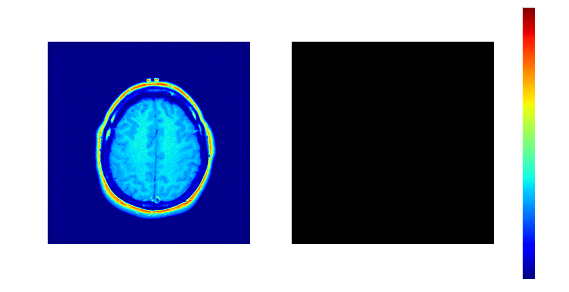

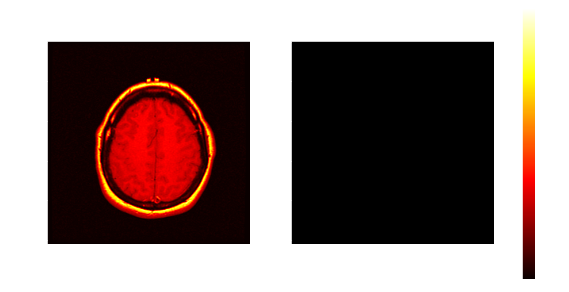

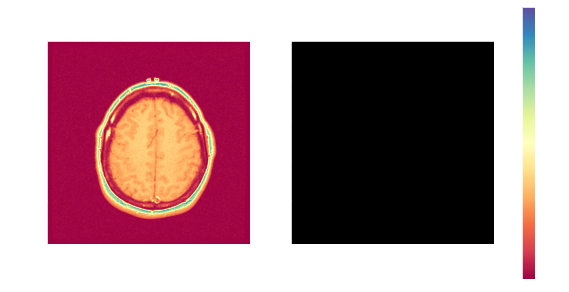

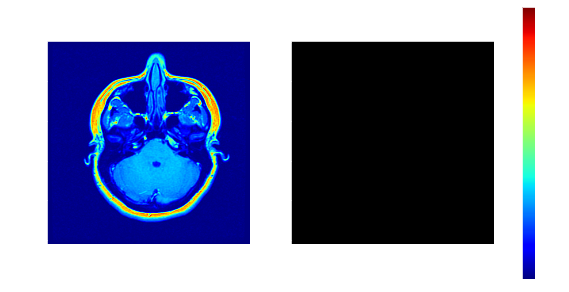

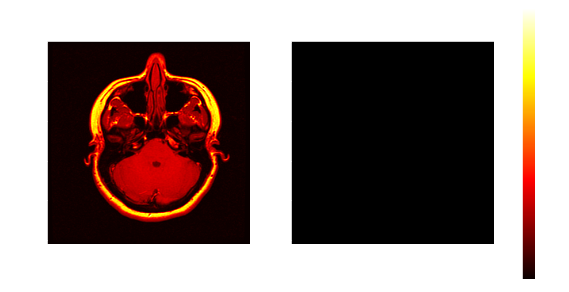

...

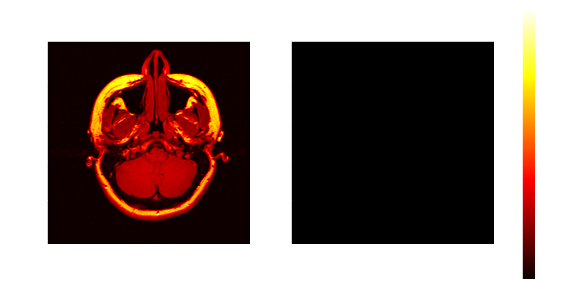

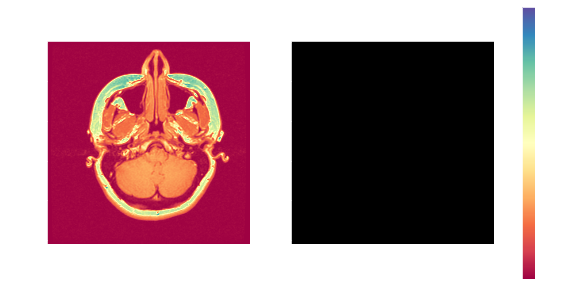

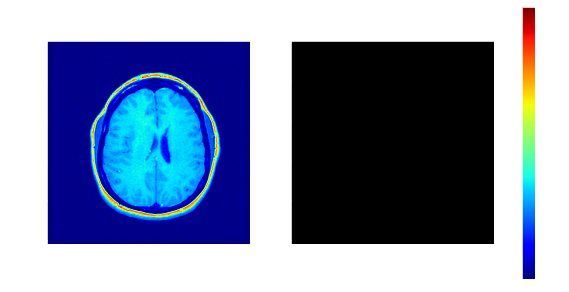

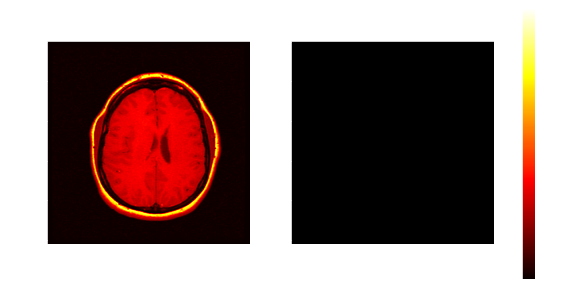

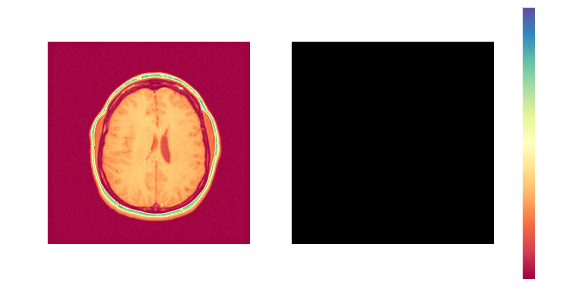

In [ ]:
for i in range(20,30):
    for j in cmap:
        plot_images(i,j)

Blending

In [ ]:
def plot_images(idx):
    imagePath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['images'].iloc[idx])
    maskPath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['masks'].iloc[idx])
    figure,axis = plt.subplots(1,2,figsize=(10,10))

    Example_Reading_Image = cv2.cvtColor(cv2.imread(imagePath),cv2.COLOR_BGR2RGB)
    Example_Reading_Mask = cv2.cvtColor(cv2.imread(maskPath),cv2.COLOR_BGR2GRAY)

    Copy_IMG = Example_Reading_Image.copy()
    Copy_IMG[Example_Reading_Mask == 1] = [255,0,0]
    Copy_IMG[Example_Reading_Mask == 2] = [0,255,255]

    Copy_IMG_Two = Example_Reading_Image.copy()
    Blend_Image = cv2.addWeighted(Copy_IMG,0.5,Copy_IMG_Two,0.5,0,Copy_IMG_Two)

    axis[0].set_xlabel(Example_Reading_Image.shape)
    axis[0].set_ylabel(Example_Reading_Image.size)
    axis[0].set_title("TUMOR")
    axis[0].imshow(Example_Reading_Image)

    axis[1].set_xlabel(Blend_Image.shape)
    axis[1].set_ylabel(Blend_Image.size)
    axis[1].set_title("BLEND")
    Example_Colorbar_Plt = axis[1].imshow(Blend_Image)

    figure.colorbar(Example_Colorbar_Plt,
                    ax=axis.ravel().tolist(),
                    shrink=0.5,
                    ticks=range(6),
                    label='DENSITY')

https://docs.opencv.org/4.5.2/d5/dc4/tutorial_adding_images.html

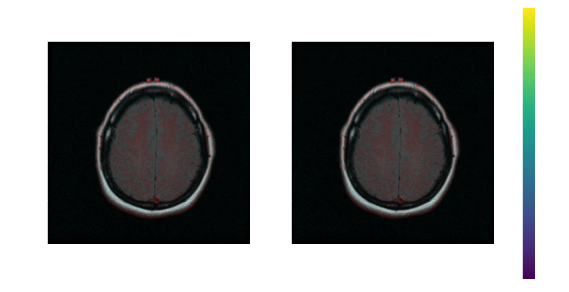

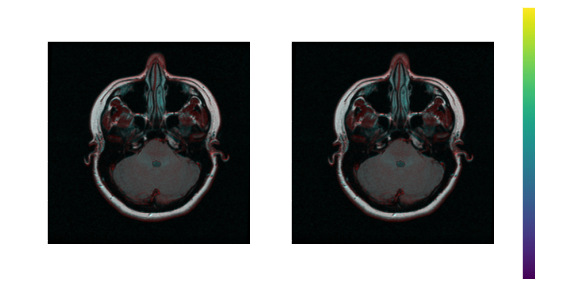

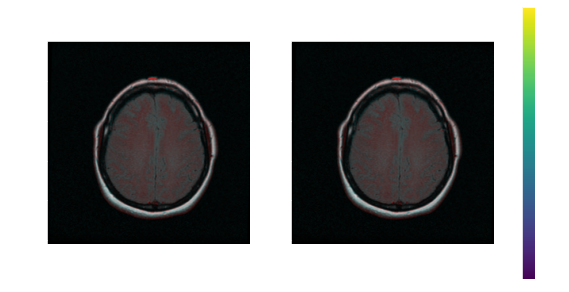

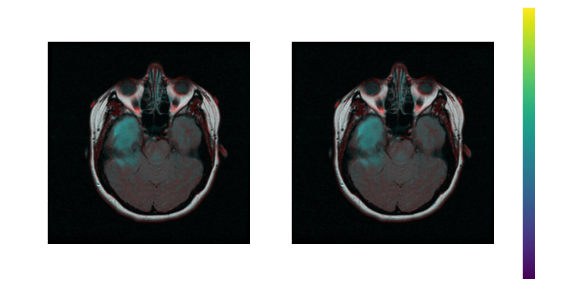

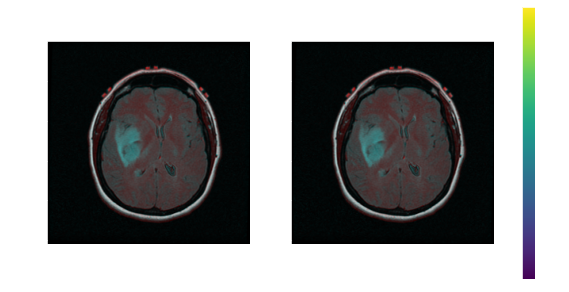

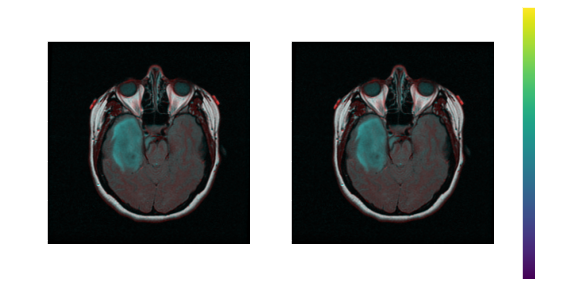

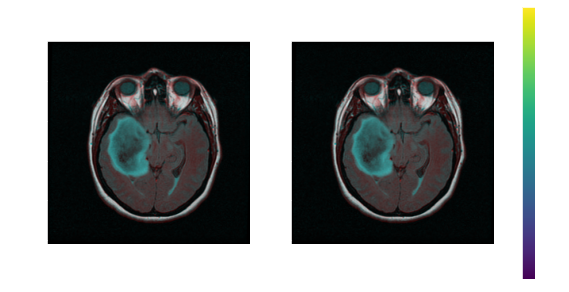

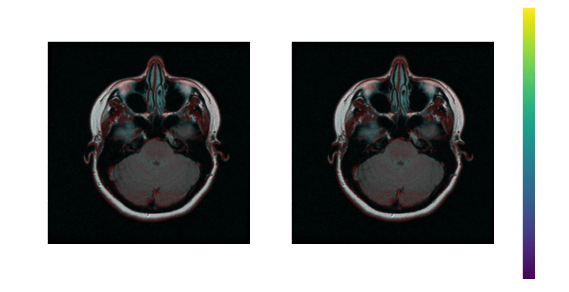

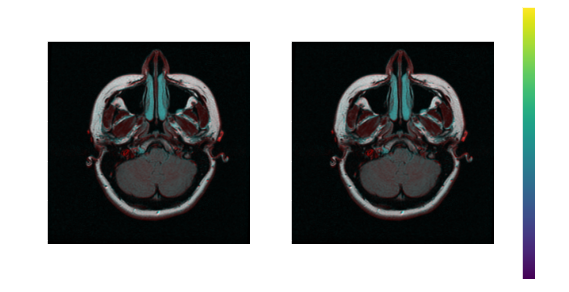

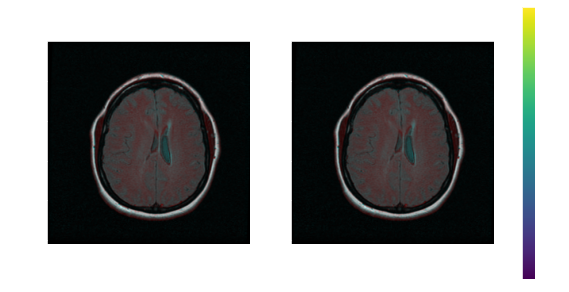

In [ ]:
for i in range(20,30):
    plot_images(i)

In [ ]:
def plot_images(idx):
    imagePath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['images'].iloc[idx])
    maskPath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['masks'].iloc[idx])
    figure,axis = plt.subplots(1,2,figsize=(10,10))

    Example_Reading_Image = cv2.cvtColor(cv2.imread(imagePath),cv2.COLOR_BGR2RGB)
#     Example_Reading_Mask = cv2.cvtColor(cv2.imread(maskPath),cv2.COLOR_BGR2RGB)
    Example_Reading_Mask = cv2.imread(maskPath)

    Blend_Image = cv2.addWeighted(Example_Reading_Image,0.8,Example_Reading_Mask,0.4,0.5)

    axis[0].set_xlabel(Example_Reading_Image.shape)
    axis[0].set_ylabel(Example_Reading_Image.size)
    axis[0].set_title("TUMOR")
    axis[0].imshow(Example_Reading_Image)

    axis[1].set_xlabel(Blend_Image.shape)
    axis[1].set_ylabel(Blend_Image.size)
    axis[1].set_title("BLEND")
    Example_Colorbar_Plt = axis[1].imshow(Blend_Image,cmap="jet")

    figure.colorbar(Example_Colorbar_Plt,
                    ax=axis.ravel().tolist(),
                    shrink=0.5,
                    ticks=range(6),
                    label='DENSITY')

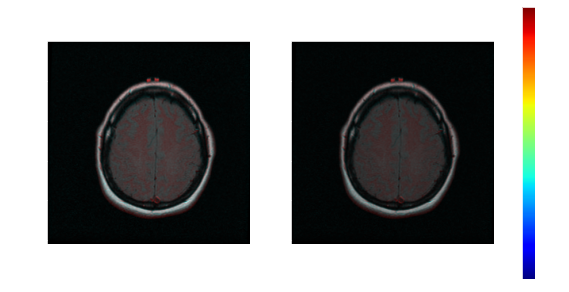

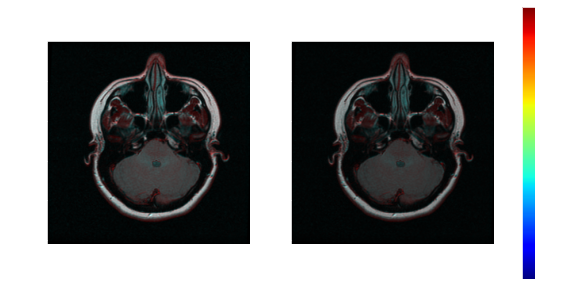

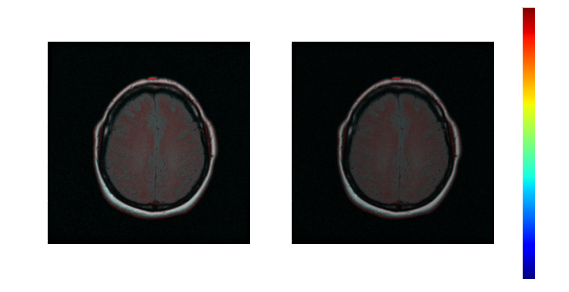

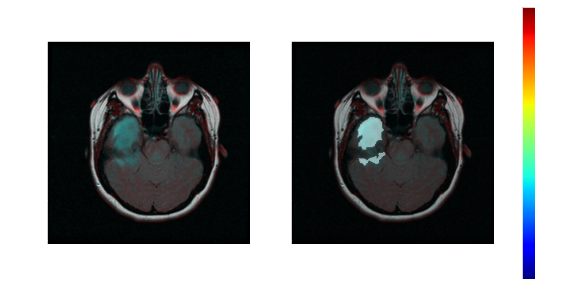

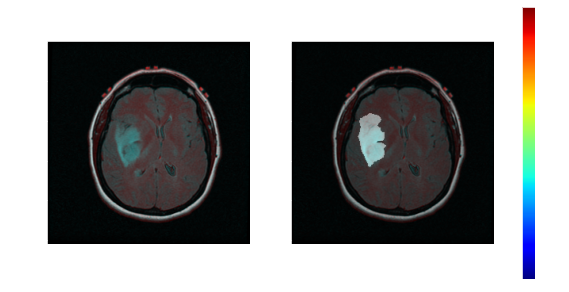

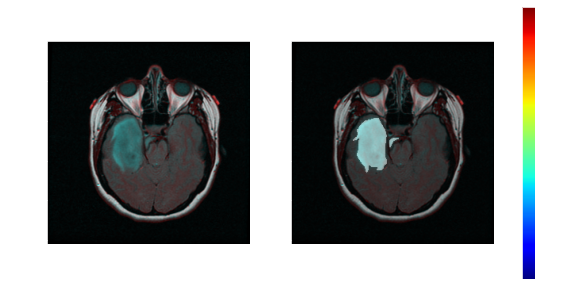

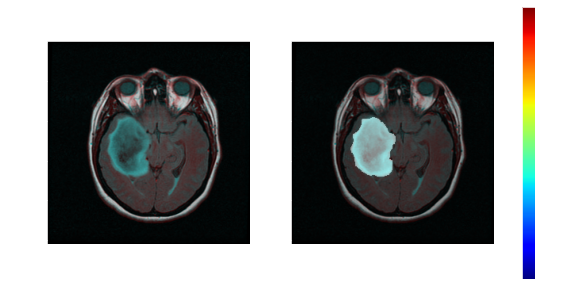

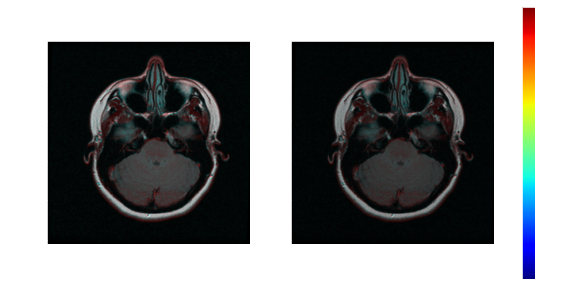

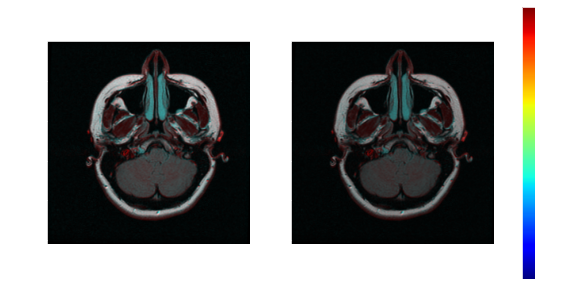

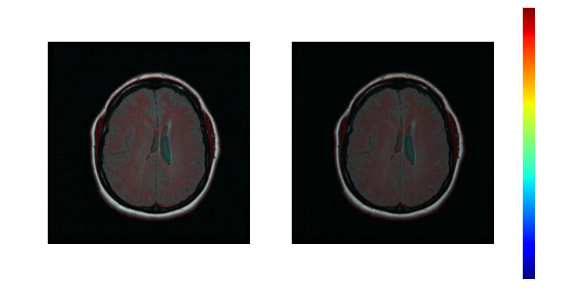

In [ ]:
for i in range(20,30):
    plot_images(i)

In [ ]:
def plot_images(idx):
    imagePath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['images'].iloc[idx])
    maskPath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['masks'].iloc[idx])
    figure,axis = plt.subplots(1,3,figsize=(10,10))

    Example_Reading_Image = cv2.cvtColor(cv2.imread(imagePath),cv2.COLOR_BGR2RGB)
    Example_Reading_Mask = cv2.cvtColor(cv2.imread(maskPath),cv2.IMREAD_GRAYSCALE)
    Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

    Example_Kernel = np.ones((5,5),np.uint8)
    Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)
    # The first parameter is the original image,
    # kernel is the matrix with which image is
    # convolved and third parameter is the number
    # of iterations, which will determine how much
    # you want to erode/dilate a given image. 

    Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

    axis[0].set_xlabel(Example_Reading_Image.shape)
    axis[0].set_ylabel(Example_Reading_Image.size)
    axis[0].set_title("TUMOR")
    Example_Colorbar_Plt = axis[0].imshow(Example_Reading_Image)

    axis[1].set_xlabel(Example_Reading_Mask.shape)
    axis[1].set_ylabel(Example_Reading_Mask.size)
    axis[1].set_title("MASK")
    axis[1].imshow(Example_Reading_Mask)


    axis[2].set_xlabel(Blend_Image.shape) 
    axis[2].set_ylabel(Blend_Image.size)
    axis[2].set_title("MASK CANNY")
    axis[2].imshow(Blend_Image) #cmap

    figure.colorbar(Example_Colorbar_Plt,
                    ax=axis.ravel().tolist(),
                    shrink=0.5,
                    ticks=range(6),
                    label='DENSITY')

https://docs.opencv.org/3.4/da/d22/tutorial_py_canny.html

https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_morphological_ops/py_morphological_ops.html

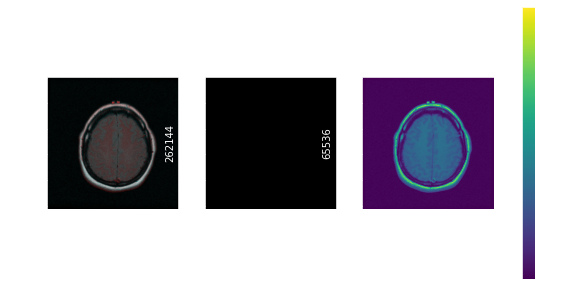

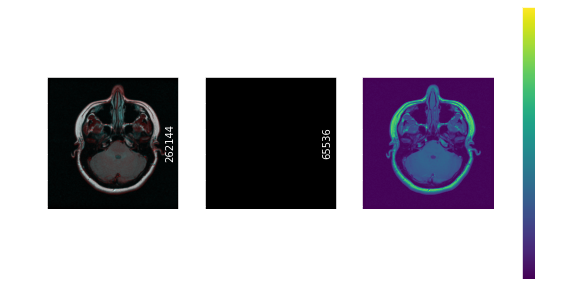

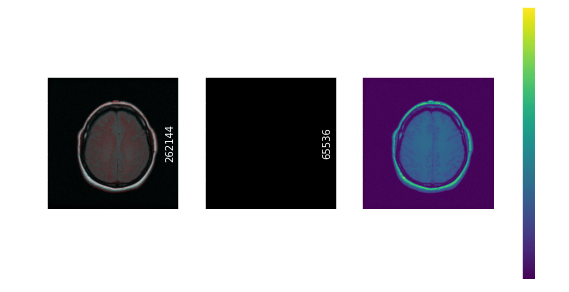

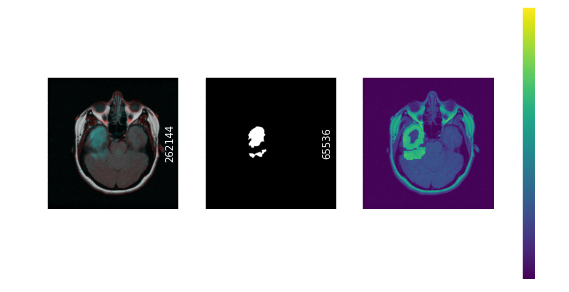

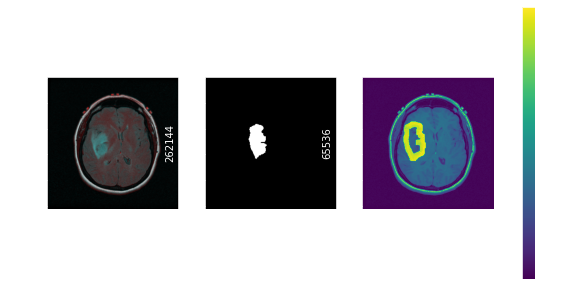

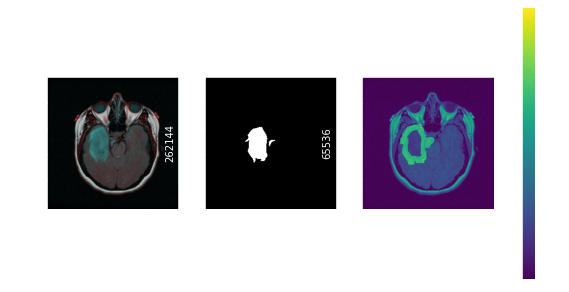

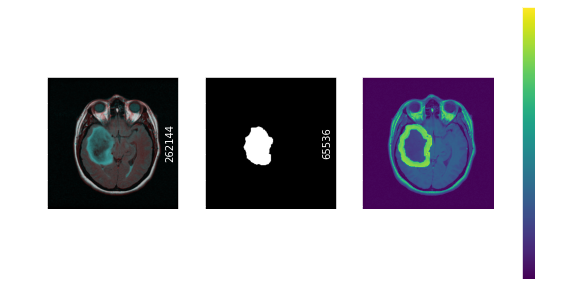

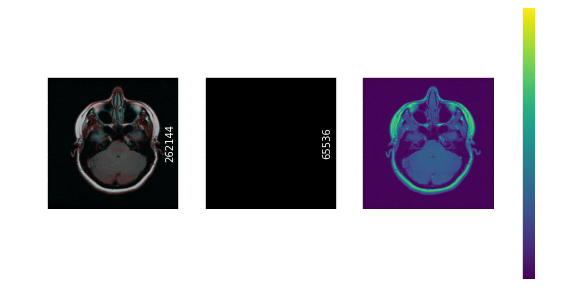

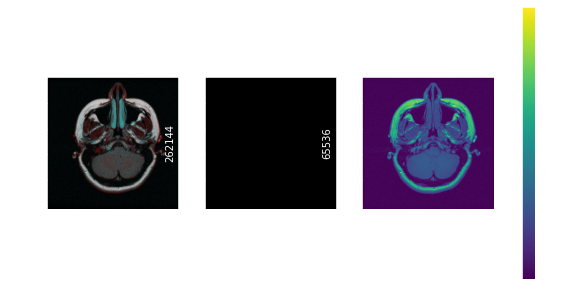

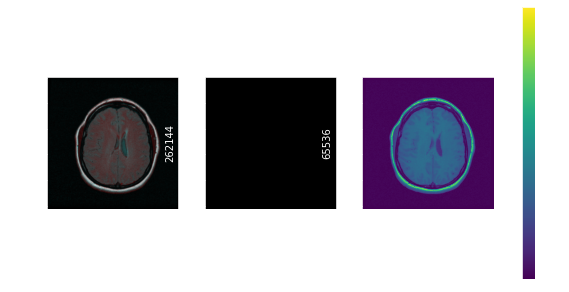

In [ ]:
for i in range(20,30):
    plot_images(i)

In [ ]:
from skimage.feature import hessian_matrix, hessian_matrix_eigvals


In [ ]:
def plot_images(idx):
    imagePath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['images'].iloc[idx])
    maskPath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['masks'].iloc[idx])
    figure,axis = plt.subplots(1,3,figsize=(10,10))

    Example_Reading_Image = cv2.cvtColor(cv2.imread(imagePath),cv2.COLOR_BGR2RGB)
    Example_Reading_Mask = cv2.cvtColor(cv2.imread(maskPath),cv2.IMREAD_GRAYSCALE)
    Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

    Example_Kernel = np.ones((5,5),np.uint8)
    Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

    Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)
    Example_Hessian_Image = hessian_matrix(Blend_Image,sigma=0.5,order="rc")
    Max_Ex_IMG,Min_Ex_IMG = hessian_matrix_eigvals(Example_Hessian_Image)

    axis[0].set_xlabel(Example_Reading_Image.shape)
    axis[0].set_ylabel(Example_Reading_Image.size)
    axis[0].set_title("TUMOR")
    axis[0].imshow(Example_Reading_Image)

    axis[1].set_xlabel(Max_Ex_IMG.shape)
    axis[1].set_ylabel(Max_Ex_IMG.size)
    axis[1].set_title("MAX")
    Example_Colorbar_Plt_Two = axis[1].imshow(Max_Ex_IMG,cmap="hot")
    figure.colorbar(Example_Colorbar_Plt_Two,
                    ax=axis.ravel().tolist(),
                    shrink=0.5,
                    ticks=range(6),
                    label='DENSITY')


    axis[2].set_xlabel(Min_Ex_IMG.shape)
    axis[2].set_ylabel(Min_Ex_IMG.size)
    axis[2].set_title("MIN")
    Example_Colorbar_Plt = axis[2].imshow(Min_Ex_IMG,cmap="hot")

    figure.colorbar(Example_Colorbar_Plt,
                    ax=axis.ravel().tolist(),
                    shrink=0.5,
                    ticks=range(6),
                    label='DENSITY')

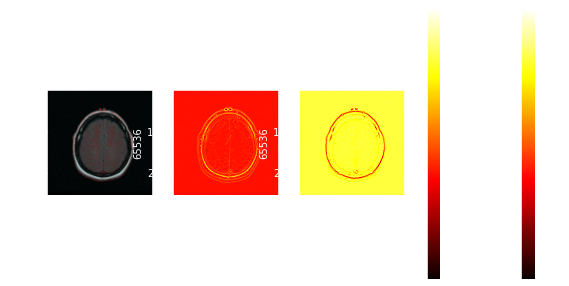

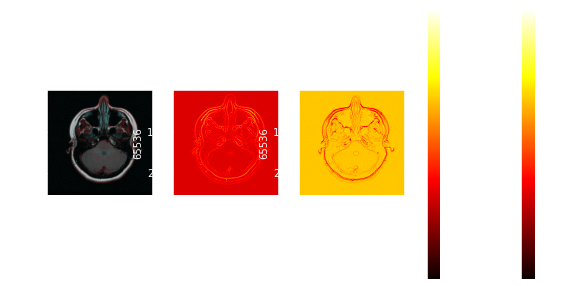

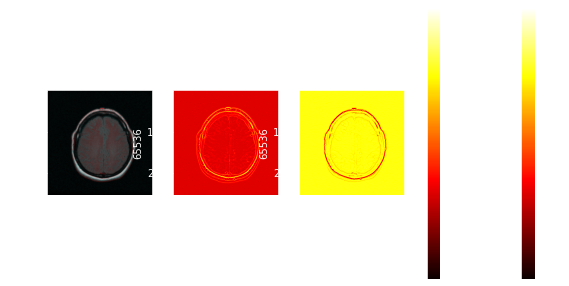

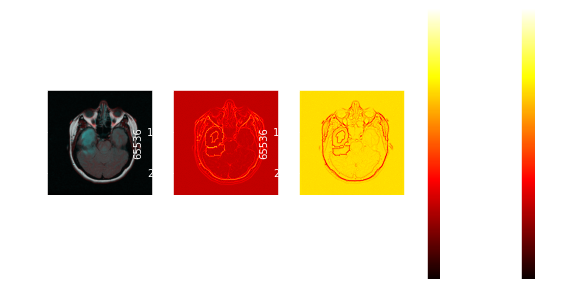

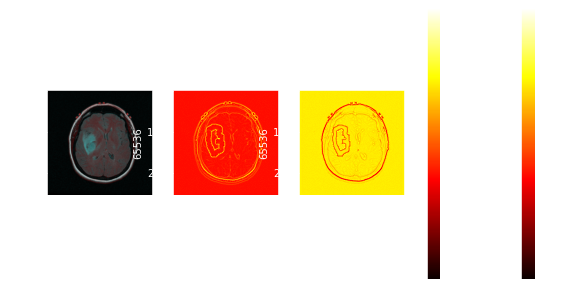

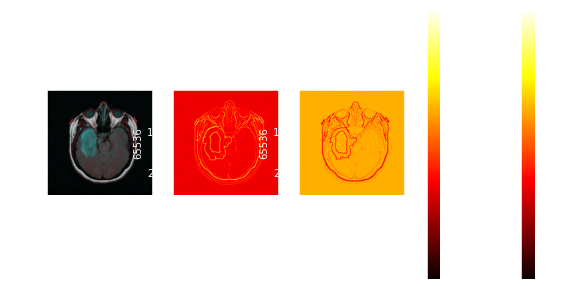

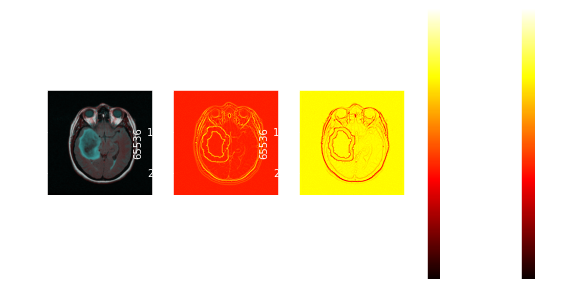

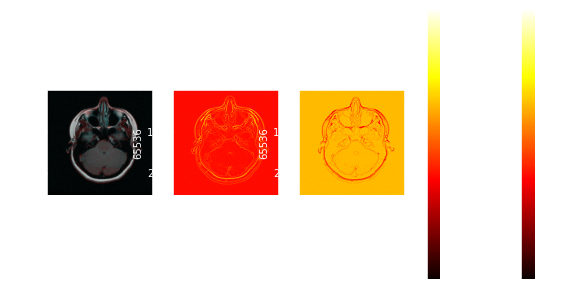

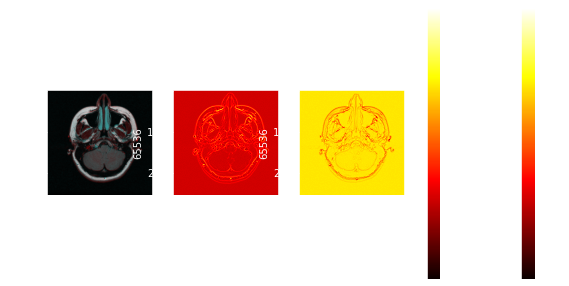

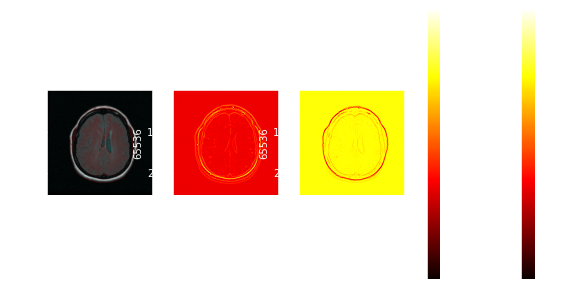

In [ ]:
for i in range(20,30):
    plot_images(i)

In [ ]:
pip install opencv-contrib-python

In [ ]:
def plot_images(idx):
    imagePath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['images'].iloc[idx])
    maskPath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['masks'].iloc[idx])
    figure,axis = plt.subplots(1,3,figsize=(10,10))

    Example_Reading_Image = cv2.cvtColor(cv2.imread(imagePath),cv2.COLOR_BGR2RGB)
    Example_Reading_Mask = cv2.cvtColor(cv2.imread(maskPath),cv2.IMREAD_GRAYSCALE)
    Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)

    Example_Kernel = np.ones((5,5),np.uint8)
    Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

    Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

    sift_function  = cv2.SIFT_create()
    keypoints,descriptors = sift_function.detectAndCompute(Example_Canny_Image,None)

    Example_Keypoints = cv2.drawKeypoints(Blend_Image,keypoints,Blend_Image)


    axis[0].set_xlabel(Example_Reading_Image.shape)
    axis[0].set_ylabel(Example_Reading_Image.size)
    axis[0].set_title("TUMOR")
    axis[0].imshow(Example_Reading_Image)

    axis[1].set_xlabel(Example_Keypoints.shape)
    axis[1].set_ylabel(Example_Keypoints.size)
    axis[1].set_title("KEYPOINTS")
    axis[1].imshow(Example_Keypoints)


    axis[2].set_xlabel(Blend_Image.shape)
    axis[2].set_ylabel(Blend_Image.size)
    axis[2].set_title("MASK CANNY")
    axis[2].imshow(Blend_Image)

In [ ]:
for i in range(20,30):
    plot_images(i)

In [ ]:
import skimage

In [ ]:
def plot_images(idx):
    imagePath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['images'].iloc[idx])
    maskPath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['masks'].iloc[idx])
    figure,axis = plt.subplots(1,4,figsize=(10,10))

    Example_Reading_Image = cv2.cvtColor(cv2.imread(imagePath),cv2.COLOR_BGR2RGB)
    Example_Reading_Mask = cv2.cvtColor(cv2.imread(maskPath),cv2.IMREAD_GRAYSCALE)
    Example_Canny_Image = cv2.Canny(Example_Reading_Mask,10,100)


    Example_Kernel = np.ones((5,5),np.uint8)
    Example_Dilation_Image = cv2.dilate(Example_Canny_Image,Example_Kernel,iterations = 2)

    _,Threshold_Image= cv2.threshold(Example_Reading_Image[:,:,0],50,255,cv2.THRESH_TOZERO_INV)
    Array_Image = np.array(Example_Reading_Image[:,:,0] > Threshold_Image).astype(int)
    Example_Skeleton_Image = skimage.morphology.skeletonize(Array_Image)

    Blend_Image = cv2.addWeighted(Example_Reading_Image[:,:,0],0.8,Example_Dilation_Image,0.4,0.5)

    axis[0].set_xlabel(Example_Reading_Image.shape)
    axis[0].set_ylabel(Example_Reading_Image.size)
    axis[0].set_title("TUMOR")
    axis[0].imshow(Example_Reading_Image)

    axis[1].set_xlabel(Example_Reading_Mask.shape)
    axis[1].set_ylabel(Example_Reading_Mask.size)
    axis[1].set_title("MASK")
    axis[1].imshow(Example_Reading_Mask)


    axis[2].set_xlabel(Blend_Image.shape)
    axis[2].set_ylabel(Blend_Image.size)
    axis[2].set_title("MASK CANNY")
    axis[2].imshow(Blend_Image)

    axis[3].set_xlabel(Example_Skeleton_Image.shape)
    axis[3].set_ylabel(Example_Skeleton_Image.size)
    axis[3].set_title("SKELETON")
    axis[3].imshow(Example_Skeleton_Image)

https://www.geeksforgeeks.org/python-thresholding-techniques-using-opencv-set-1-simple-thresholding/

https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_thresholding/py_thresholding.html

https://scikit-image.org/docs/dev/api/skimage.morphology.html#skimage.morphology.skeletonize

https://scikit-image.org/docs/dev/auto_examples/applications/plot_morphology.html#sphx-glr-auto-examples-applications-plot-morphology-py

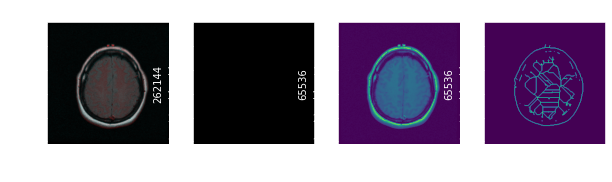

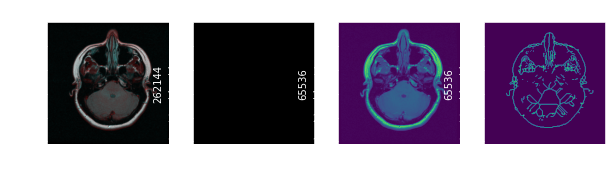

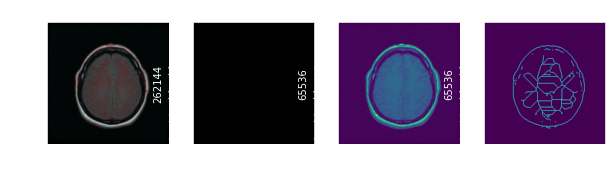

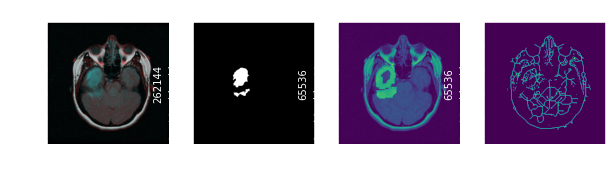

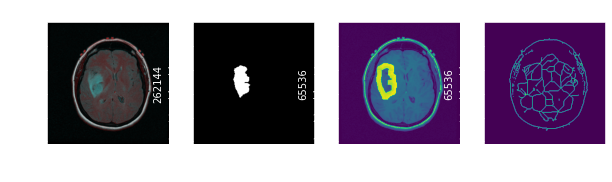

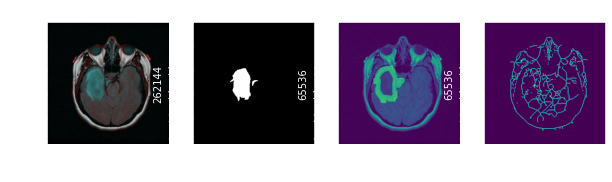

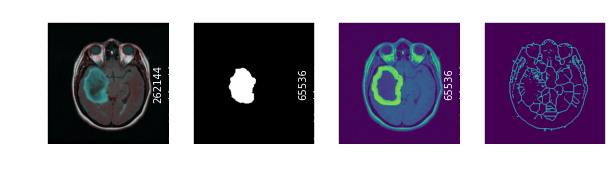

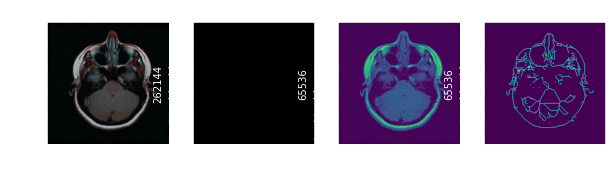

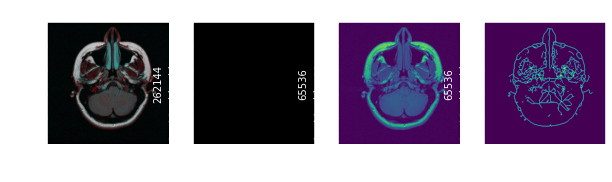

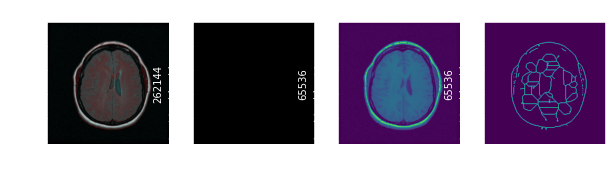

In [ ]:
for i in range(20,30):
    plot_images(i)

In [ ]:
imagePath_df['image-path'] = DataPath + imagePath_df['directory'] + '/' + imagePath_df['images']
imagePath_df['mask-path'] = DataPath + imagePath_df['directory'] + '/' + imagePath_df['masks'] 

In [ ]:
from sklearn.model_selection import train_test_split


In [ ]:
train , test = train_test_split(imagePath_df, test_size=0.25, random_state=21)

In [ ]:
EPOCHS = 35
BATCH_SIZE = 32
ImgHieght = 256
ImgWidth = 256
Channels = 3

In [ ]:
data_augmentation = dict(rotation_range=0.2,
                        width_shift_range=0.05,
                        height_shift_range=0.05,
                        shear_range=0.05,
                        zoom_range=0.05,
                        horizontal_flip=True,
                        fill_mode='nearest')

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [ ]:
# image generator
imagegen = ImageDataGenerator(rescale=1./255., **data_augmentation)
maskgen = ImageDataGenerator(rescale=1./255., **data_augmentation)


# train generator
timage_generator=imagegen.flow_from_dataframe(dataframe=train,
                                            x_col="image-path",
                                            batch_size= BATCH_SIZE,
                                            seed=42,
                                            class_mode=None,
                                            target_size=(ImgHieght,ImgWidth),
                                            color_mode='rgb')
# validation data generator
tmask_generator=maskgen.flow_from_dataframe(dataframe=train,
                                            x_col="mask-path",
                                            batch_size=BATCH_SIZE,
                                            seed=42,
                                            class_mode=None,
                                            target_size=(ImgHieght,ImgWidth),
                                            color_mode='grayscale') 

Found 2946 validated image filenames.
Found 2946 validated image filenames.


In [ ]:
# image generator
imagegen = ImageDataGenerator(rescale=1./255.)
maskgen = ImageDataGenerator(rescale=1./255.)


# train generator
vimage_generator=imagegen.flow_from_dataframe(dataframe=test,
                                            x_col="image-path",
                                            batch_size= BATCH_SIZE,
                                            seed=42,
                                            class_mode=None,
                                            target_size=(ImgHieght,ImgWidth),
                                            color_mode='rgb')
# validation data generator
vmask_generator=maskgen.flow_from_dataframe(dataframe=test,
                                            x_col="mask-path",
                                            batch_size=BATCH_SIZE,
                                            seed=42,
                                            class_mode=None,
                                            target_size=(ImgHieght,ImgWidth),
                                            color_mode='grayscale')

Found 983 validated image filenames.
Found 983 validated image filenames.


In [ ]:
def data_iterator(image_gen, mask_gen):
    for img, mask in zip(image_gen, mask_gen):
        yield img, mask

https://stackoverflow.com/questions/231767/what-does-the-yield-keyword-do

In [ ]:
train_gen = data_iterator(timage_generator, tmask_generator)
valid_gen = data_iterator(vimage_generator, vmask_generator)

In [ ]:
inputs = tf.keras.layers.Input((ImgHieght, ImgWidth, Channels))
# s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)

#Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)
 
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)
 
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)
 
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#Expansive path 
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
 
u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
 
u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
 
u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
 
outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)
 
model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 256, 256, 16) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 16) 2320        dropout[0][0]                    
______________________________________________________________________________________________

In [ ]:
STEP_SIZE_TRAIN = timage_generator.n/BATCH_SIZE
STEP_SIZE_VALID = vimage_generator.n/BATCH_SIZE

In [ ]:
#Modelcheckpoint
checkpointer = tf.keras.callbacks.ModelCheckpoint('model_for_nuclei.h5', verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')]

# results = model.fit(train_gen, batch_size=16, epochs=25, callbacks=callbacks)
results=model.fit(train_gen,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    batch_size=16,
                    epochs=25,
                    callbacks=callbacks,
                    validation_data=valid_gen,
                   validation_steps=STEP_SIZE_VALID)

Epoch 1/25
92/92 [==============================] - 2238s 24s/step - loss: 0.1501 - accuracy: 0.9551 - val_loss: 0.0342 - val_accuracy: 0.9894
Epoch 2/25
92/92 [==============================] - 71s 780ms/step - loss: 0.0276 - accuracy: 0.9890 - val_loss: 0.0273 - val_accuracy: 0.9896
Epoch 3/25
92/92 [==============================] - 71s 782ms/step - loss: 0.0231 - accuracy: 0.9890 - val_loss: 0.0246 - val_accuracy: 0.9894
Epoch 5/25
92/92 [==============================] - 72s 784ms/step - loss: 0.0209 - accuracy: 0.9890 - val_loss: 0.0304 - val_accuracy: 0.9893
Epoch 6/25
92/92 [==============================] - 72s 782ms/step - loss: 0.0200 - accuracy: 0.9907 - val_loss: 0.0192 - val_accuracy: 0.9932
Epoch 7/25
92/92 [==============================] - 71s 776ms/step - loss: 0.0162 - accuracy: 0.9939 - val_loss: 0.0155 - val_accuracy: 0.9949
Epoch 8/25
92/92 [==============================] - 71s 777ms/step - loss: 0.0160 - accuracy: 0.9940 - val_loss: 0.0156 - val_accuracy: 0.9952

In [ ]:
import seaborn as sns 

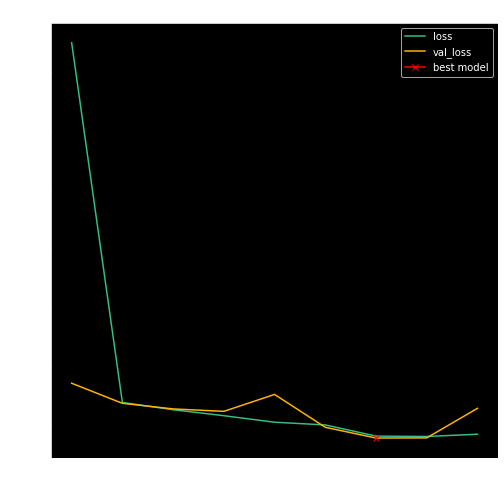

In [ ]:
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(results.history["loss"], label="loss", color=sns.xkcd_rgb['greenish teal'])
plt.plot(results.history["val_loss"], label="val_loss", color=sns.xkcd_rgb['amber'])
plt.plot( np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend()
# plt.grid(False)
plt.show()

In [ ]:
# load the best model
model.load_weights('model_for_nuclei.h5')

In [ ]:
eval_results = model.evaluate(valid_gen, steps=STEP_SIZE_VALID, verbose=1)

30/30 [==============================] - 4s 145ms/step - loss: 0.0263 - accuracy: 0.9933


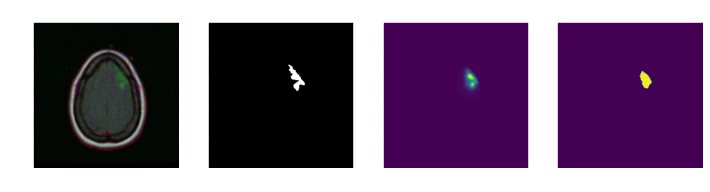

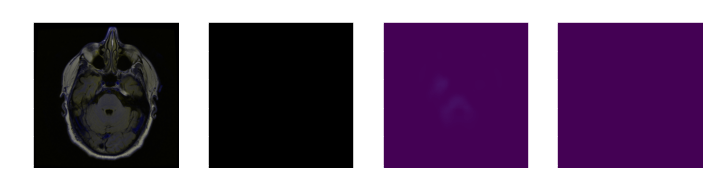

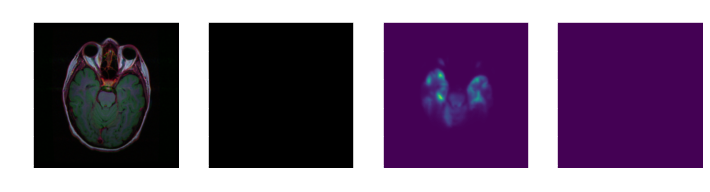

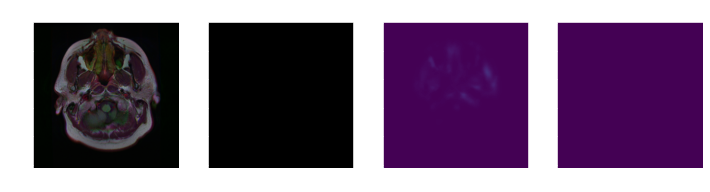

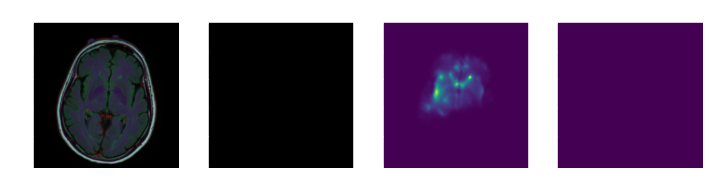

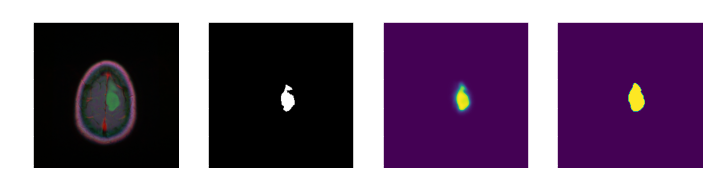

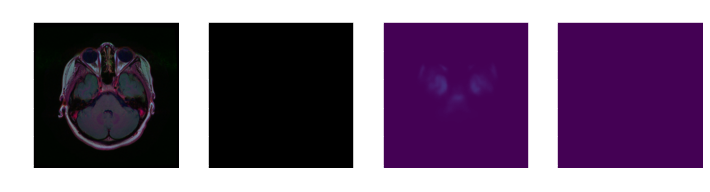

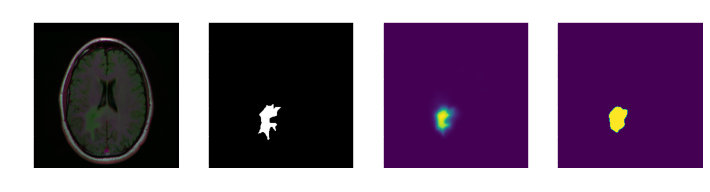

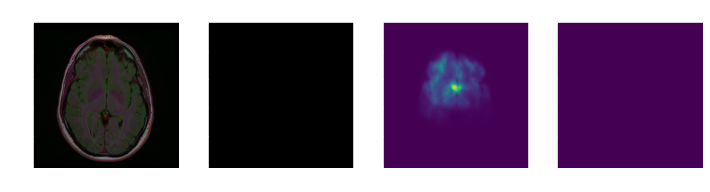

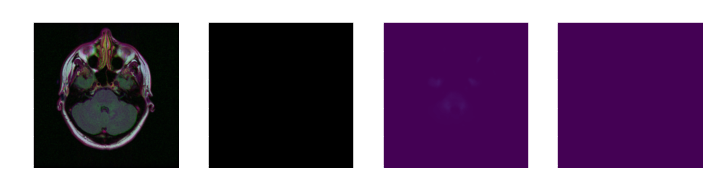

In [ ]:
for i in range(10):
    idx = np.random.randint(0, len(imagePath_df))
    
    imagePath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['images'].iloc[idx])
    maskPath = os.path.join(DataPath, imagePath_df['directory'].iloc[idx], imagePath_df['masks'].iloc[idx])
    
    image = cv2.imread(imagePath)
    mask = cv2.imread(maskPath)
    
    img = cv2.resize(image ,(ImgHieght, ImgWidth))
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred=model.predict(img)

    plt.figure(figsize=(12,12))
    plt.subplot(1,4,1)
    plt.imshow(np.squeeze(img))
    plt.title('Original Image')
    plt.subplot(1,4,2)
    plt.imshow(mask)
    plt.title('Original Mask')
    plt.subplot(1,4,3)
    plt.imshow(np.squeeze(pred))
    plt.title('Prediction')
    plt.subplot(1,4,4)
    plt.imshow(np.squeeze(pred) > 0.2)
    plt.title('BinaryPrediction')
    plt.show()